In [1]:
import os
import random
import pickle
import numpy as np

seed = 624
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)

with open('../appendix/qm9_test_selected.pkl', 'rb') as f:
    selected_df = pickle.load(f)

In [2]:
import numpy as np
from sklearn.manifold import TSNE

tsne = TSNE(2)
tsne_molecular_embeddings = tsne.fit_transform(np.vstack(selected_df['molecular_embeddings'].to_list()))
tsne_spectral_embeddings = tsne.fit_transform(np.vstack(selected_df['spectral_embeddings'].to_list()))

selected_df['tsne_molecular_embeddings'] = tsne_molecular_embeddings.tolist()
selected_df['tsne_spectral_embeddings'] = tsne_spectral_embeddings.tolist()

In [3]:
selected_df.head()

,smiles,norm_smiles,kekule_smiles,raman,ir,filename,molecular_embeddings,spectral_embeddings,fg_labels,tsne_molecular_embeddings,tsne_spectral_embeddings,molecular_fingerprints
0,COCC12CC1OC2=N,COCC12CC1OC2=N,COCC12CC1OC2=N,"[0.0072977924443202126, 0.007689660186477004, ...","[0.0012789192229568133, 0.0013706530294091428,...",dsgdb9nsd_119549,"[1.0548375844955444, 0.23122718930244446, -0.4...","[-2.545661449432373, -3.4150359630584717, -3.5...",ether,"[-19.22111701965332, -58.08860778808594]","[4.015784740447998, 31.904529571533203]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ..."
2,OCC1C(O)C1O,OCC1C(O)C1O,OCC1C(O)C1O,"[0.0057032326430694604, 0.005806273506485144, ...","[0.015559643181603404, 0.017281087545660052, 0...",dsgdb9nsd_003107,"[1.4880315065383911, 2.531283378601074, 3.3790...","[1.059224247932434, 5.8863725662231445, 5.3673...",alcohol,"[2.871739625930786, 67.53866577148438]","[68.0464859008789, 49.34075164794922]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
5,NC1=C(N)C(=O)C=NN1,Nc1[nH]ncc(=O)c1N,NC1=C(N)C(=O)C=NN1,"[0.00881777689939991, 0.008680433515139122, 0....","[0.005349009389225523, 0.005212565544771749, 0...",dsgdb9nsd_129651,"[-2.543625831604004, 1.3542344570159912, -0.60...","[-5.627308368682861, 3.3836076259613037, 0.084...",amine,"[-93.56182861328125, 2.1462934017181396]","[-54.23551559448242, 58.6713981628418]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
11,CC1(C)CC(C1)C#N,CC1(C)CC(C#N)C1,CC1(C)CC(C#N)C1,"[0.025324009337826185, 0.02492696520495079, 0....","[0.0015472609201712443, 0.0018088551306476046,...",dsgdb9nsd_006141,"[-1.4348502159118652, -0.06616313755512238, 3....","[-2.7990198135375977, -2.5988237857818604, 6.0...",nitrile,"[30.599388122558594, 7.069908618927002]","[21.494972229003906, 7.536005973815918]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
12,NC(=O)CC1=NOC=N1,NC(=O)Cc1ncon1,NC(=O)CC1=NOC=N1,"[0.44446300805423833, 0.25886401847126506, 0.1...","[0.12944330527602332, 0.08045415978747371, 0.0...",dsgdb9nsd_129474,"[1.8020082712173462, 1.4322150945663452, 0.380...","[1.5754653215408325, 1.5943784713745117, -1.35...",amide,"[-54.00101089477539, -26.91448402404785]","[-58.86981201171875, 66.62603759765625]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."


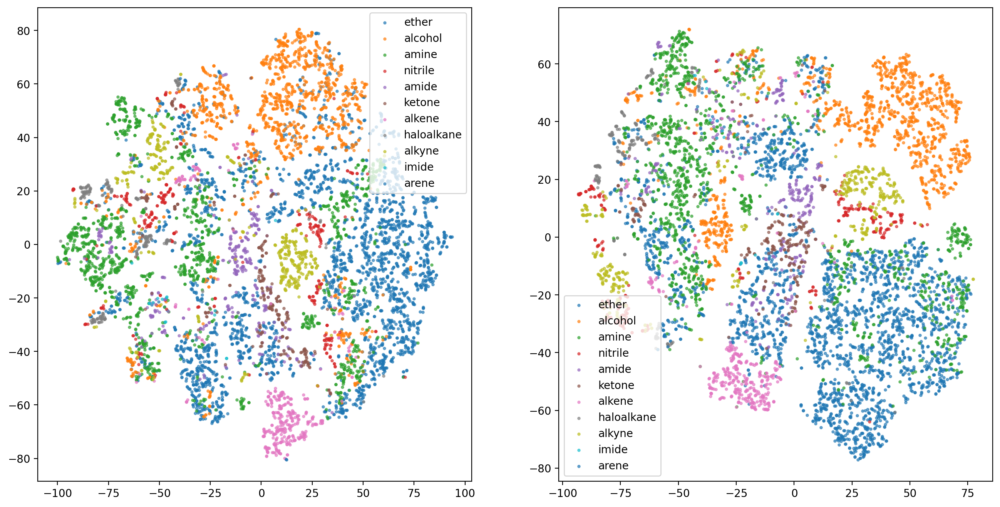

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8), dpi=200)
plt.subplot(121)
for fg in selected_df.fg_labels.unique():
    if fg == 'None':
        continue
    fg_df = selected_df[selected_df.fg_labels == fg]
    plt.scatter(np.array(fg_df.tsne_molecular_embeddings.to_list())[:, 0],
                np.array(fg_df.tsne_molecular_embeddings.to_list())[:, 1], label=fg, alpha=0.6, s=4.5)
plt.legend()

plt.subplot(122)
for fg in selected_df.fg_labels.unique():
    if fg == 'None':
        continue
    fg_df = selected_df[selected_df.fg_labels == fg]
    plt.scatter(np.array(fg_df.tsne_spectral_embeddings.to_list())[:, 0],
                np.array(fg_df.tsne_spectral_embeddings.to_list())[:, 1], label=fg, alpha=0.6, s=4.5)
plt.legend()


In [5]:
# demonstrate three molecules for each functional group in the test set
from rdkit.Chem import Draw
from rdkit import Chem

imgs = []
for i, fg in enumerate(selected_df.fg_labels.unique()):
    if fg == 'None' or fg == 'arene':
        continue
    fg_df = selected_df[selected_df.fg_labels == fg]
    fg_df = fg_df.sample(10)
    mols = [Chem.MolFromSmiles(i) for i in fg_df['kekule_smiles'].to_list()]
    img = Draw.MolsToGridImage(mols, molsPerRow=10, subImgSize=(300, 300), legends=fg_df['kekule_smiles'].to_list())
    imgs.append(img)

In [6]:
selected_df.groupby('fg_labels').count()
# 'ether'：醚
# 'alcohol'：醇
# 'amine'：胺
# 'nitrile'：腈
# 'amide'：酰胺
# 'ketone'：酮
# 'alkene'：烯烃
# 'haloalkane'：卤代烷烃
# 'alkyne'：炔烃
# 'imide'：酰亚胺
# 'arene'：芳烃

,smiles,norm_smiles,kekule_smiles,raman,ir,filename,molecular_embeddings,spectral_embeddings,tsne_molecular_embeddings,tsne_spectral_embeddings,molecular_fingerprints
fg_labels,,,,,,,,,,,
alcohol,1303,1303,1303,1303,1303,1303,1303,1303,1303,1303,1303
alkene,383,383,383,383,383,383,383,383,383,383,383
alkyne,484,484,484,484,484,484,484,484,484,484,484
amide,338,338,338,338,338,338,338,338,338,338,338
amine,1503,1503,1503,1503,1503,1503,1503,1503,1503,1503,1503
arene,4,4,4,4,4,4,4,4,4,4,4
ether,2950,2950,2950,2950,2950,2950,2950,2950,2950,2950,2950
haloalkane,193,193,193,193,193,193,193,193,193,193,193
imide,16,16,16,16,16,16,16,16,16,16,16


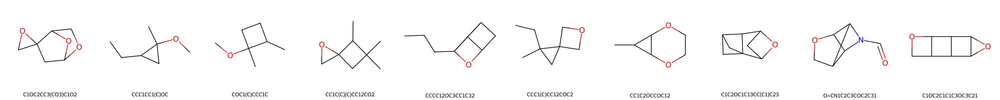

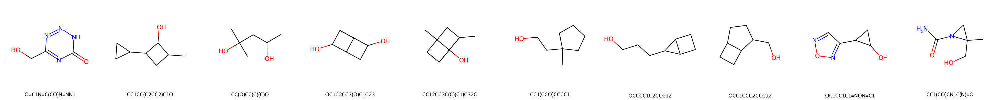

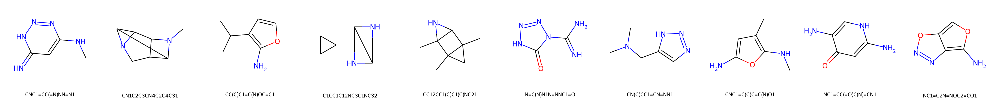

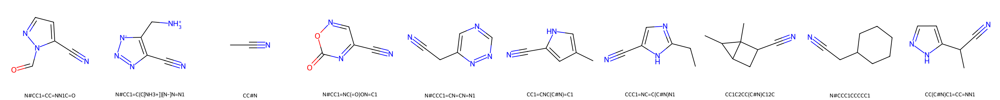

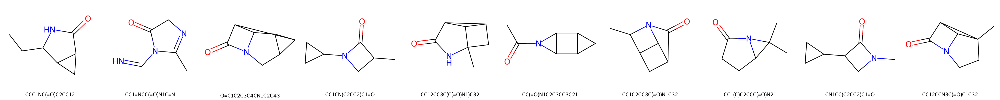

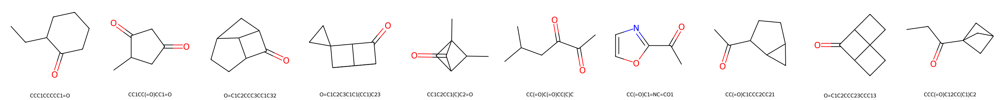

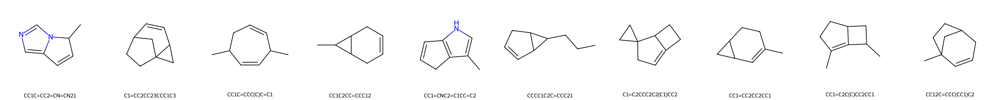

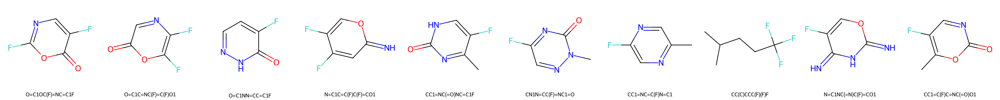

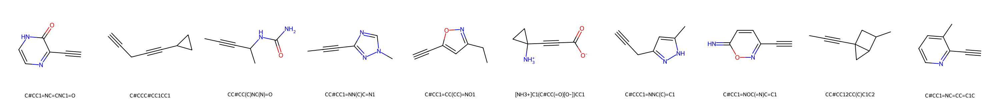

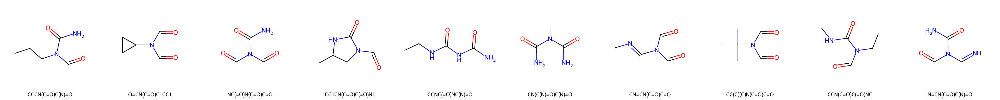

In [7]:
display(*imgs)

# pick molecules for demo

In [8]:
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG

demo_xy_mol = [None for _ in range(3)]
demo_xy_spec = [None for _ in range(3)]
demo_fg_list = [None for _ in range(3)]
demo_spec_list = [None for _ in range(3)]
demo_mol_embed = [None for _ in range(3)]
demo_spec_embed = [None for _ in range(3)]

(19, 12)
[53.005462646484375, 40.37131881713867]
[36.18645477294922, 59.56633377075195]


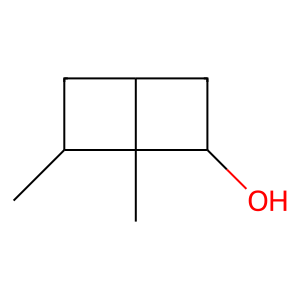

In [9]:

demo_df = selected_df[selected_df['fg_labels'] == 'alcohol']
selected_id = demo_df.apply(lambda row: (row['tsne_spectral_embeddings'][0] > 50) and (row['tsne_spectral_embeddings'][0] < 55)
                                and (row['tsne_spectral_embeddings'][1] > 40) and (row['tsne_spectral_embeddings'][1] < 45), axis=1)
demo_df = demo_df[selected_id]
demo_id = 6
print(demo_df.shape)
print(demo_df.iloc[demo_id]['tsne_spectral_embeddings'])
print(demo_df.iloc[demo_id]['tsne_molecular_embeddings'])

demo_xy_mol[0] = demo_df.iloc[demo_id]['tsne_molecular_embeddings']
demo_xy_spec[0] = demo_df.iloc[demo_id]['tsne_spectral_embeddings']
demo_fg_list[0] = 'alcohol'

mol = Chem.MolFromSmiles(demo_df.iloc[demo_id]['smiles'])

d2d = rdMolDraw2D.MolDraw2DSVG(300, 300)
d2d.DrawMolecule(mol)
d2d.FinishDrawing()
SVG(d2d.GetDrawingText())

demo_spec_list[0] = demo_df.iloc[demo_id]['raman']
demo_mol_embed[0] = demo_df.iloc[demo_id]['molecular_embeddings']
demo_spec_embed[0] = demo_df.iloc[demo_id]['spectral_embeddings']

SVG(d2d.GetDrawingText())


(32, 12)
[-28.11800193786621, 2.479416847229004]
[-25.315664291381836, 49.45569610595703]


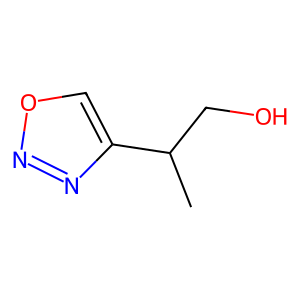

In [10]:
demo_df = selected_df[selected_df['fg_labels'] == 'alcohol']
selected_id = demo_df.apply(lambda row: (row['tsne_spectral_embeddings'][0] > -30) and (row['tsne_spectral_embeddings'][0] < -25)
                                and (row['tsne_spectral_embeddings'][1] > -5) and (row['tsne_spectral_embeddings'][1] < 5), axis=1)
demo_df = demo_df[selected_id]
demo_id = 0
print(demo_df.shape)
print(demo_df.iloc[demo_id]['tsne_spectral_embeddings'])
print(demo_df.iloc[demo_id]['tsne_molecular_embeddings'])

demo_xy_mol[1] = demo_df.iloc[demo_id]['tsne_molecular_embeddings']
demo_xy_spec[1] = demo_df.iloc[demo_id]['tsne_spectral_embeddings']
demo_fg_list[1] = 'alcohol'

mol = Chem.MolFromSmiles(demo_df.iloc[demo_id]['smiles'])

d2d = rdMolDraw2D.MolDraw2DSVG(300, 300)
d2d.DrawMolecule(mol)
d2d.FinishDrawing()
SVG(d2d.GetDrawingText())

demo_spec_list[1] = demo_df.iloc[demo_id]['raman']
demo_mol_embed[1] = demo_df.iloc[demo_id]['molecular_embeddings']
demo_spec_embed[1] = demo_df.iloc[demo_id]['spectral_embeddings']

SVG(d2d.GetDrawingText())

(37, 12)
[-76.28085327148438, -21.842679977416992]
[-50.584991455078125, 36.86273956298828]


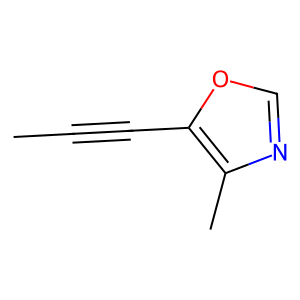

In [11]:
demo_df = selected_df[selected_df['fg_labels'] == 'alkyne']
selected_id = demo_df.apply(lambda row: (row['tsne_molecular_embeddings'][0] > -55) and (row['tsne_molecular_embeddings'][0] < -50)
                                and (row['tsne_molecular_embeddings'][1] > 35) and (row['tsne_molecular_embeddings'][1] < 45), axis=1)
demo_df = demo_df[selected_id]
demo_id = 1
print(demo_df.shape)
print(demo_df.iloc[demo_id]['tsne_spectral_embeddings'])
print(demo_df.iloc[demo_id]['tsne_molecular_embeddings'])

demo_xy_mol[2] = demo_df.iloc[demo_id]['tsne_molecular_embeddings']
demo_xy_spec[2] = demo_df.iloc[demo_id]['tsne_spectral_embeddings']
demo_fg_list[2] = 'alkyne'

mol = Chem.MolFromSmiles(demo_df.iloc[demo_id]['smiles'])

d2d = rdMolDraw2D.MolDraw2DSVG(300, 300)
d2d.DrawMolecule(mol)
d2d.FinishDrawing()
SVG(d2d.GetDrawingText())

demo_spec_list[2] = demo_df.iloc[demo_id]['raman']
demo_mol_embed[2] = demo_df.iloc[demo_id]['molecular_embeddings']
demo_spec_embed[2] = demo_df.iloc[demo_id]['spectral_embeddings']

SVG(d2d.GetDrawingText())

In [12]:
import numpy as np

def cosine_similarity(list_of_arrays):
    # 将列表中的每个array标准化为单位向量
    normalized_arrays = [arr / np.linalg.norm(arr) for arr in list_of_arrays]
    
    # 计算余弦相似度矩阵
    num_arrays = len(normalized_arrays)
    similarity_matrix = np.zeros((num_arrays, num_arrays))
    
    for i in range(num_arrays):
        for j in range(num_arrays):
            similarity_matrix[i, j] = np.dot(normalized_arrays[i], normalized_arrays[j])
    
    return similarity_matrix

correlation_matrix_mol_embeds = cosine_similarity(np.array(demo_mol_embed))
correlation_matrix_spec_embeds = cosine_similarity(np.array(demo_spec_embed))

# represente spectrum-structure correlation

In [13]:
import itertools
import numpy as np
from tqdm import tqdm

def cosine_similarity(q, k):
    q = q / np.linalg.norm(q) 
    k = k / np.linalg.norm(k)
    similarity = np.dot(q, k)
    return similarity

ids = np.arange(len(selected_df))
combs = list(itertools.combinations(ids, 2))[:1000000]

mol_emb_sim_list = []
spec_emb_sim_list = []

for comb in tqdm(combs):
    mol_emb1 = selected_df['molecular_embeddings'].iloc[comb[0]]
    mol_emb2 = selected_df['molecular_embeddings'].iloc[comb[1]]

    spec_emb1 = selected_df['spectral_embeddings'].iloc[comb[0]]
    spec_emb2 = selected_df['spectral_embeddings'].iloc[comb[1]]

    mol_emb_sim = cosine_similarity(mol_emb1, mol_emb2)
    spec_emb_sim = cosine_similarity(spec_emb1, spec_emb2)

    mol_emb_sim_list.append(mol_emb_sim)
    spec_emb_sim_list.append(spec_emb_sim)


100%|██████████| 1000000/1000000 [01:13<00:00, 13551.63it/s]


In [14]:
import pandas as pd

mol_emb_sim_list = np.array(mol_emb_sim_list)
spec_emb_sim_list = np.array(spec_emb_sim_list)

# molecular embeddings vs spectral embeddings

rank_mol_emb_sim = mol_emb_sim_list[np.argsort(spec_emb_sim_list)][::-1]
rank_spec_emb_sim = spec_emb_sim_list[np.argsort(spec_emb_sim_list)][::-1]

sim_df = pd.DataFrame({'mol_sim': rank_mol_emb_sim, 'spec_sim': rank_spec_emb_sim})

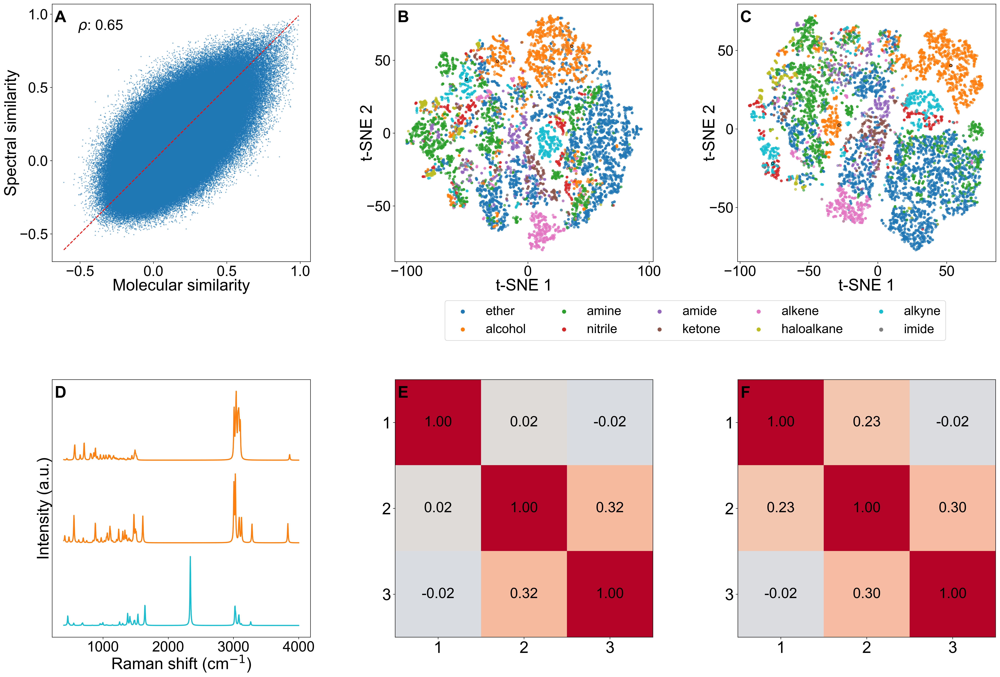

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.ticker import FuncFormatter

font_path = '/System/Library/Fonts/Supplemental/Arial.ttf' 
matplotlib.font_manager.fontManager.addfont(font_path)
plt.rcParams['font.family'] = 'Arial'
# 设置全局字体
plt.rcParams['font.sans-serif'] = ['Arial'] 

fontsize_label = 28
fontsize_legend = 22
fontsize_ticks = 25
fontsize_text = 25
scatter_size = 14

color_dict = {
            'ether': 'tab:blue', 
            'alcohol': 'tab:orange', 
            'amine': 'tab:green', 
            'nitrile': 'tab:red', 
            'amide': 'tab:purple', 
            'ketone': 'tab:brown', 
            'alkene': 'tab:pink', 
            'haloalkane': 'tab:olive', 
            'alkyne': 'tab:cyan', 
            'imide': 'tab:gray', 
            }
              
height_ratios = [1, 0.05, 1]
width_ratios=[1, 0.01, 1, 0.01, 1]
gs = gridspec.GridSpec(3, 5, height_ratios=height_ratios, width_ratios=width_ratios)

step = 8
fig = plt.figure(figsize=(step*sum(width_ratios), step*sum(height_ratios)), dpi=300)

ax = fig.add_subplot(gs[0, 0])
ax.scatter(sim_df['mol_sim'], sim_df['spec_sim'], s=1, alpha=0.5)
ax.plot([sim_df['mol_sim'].min(), sim_df['mol_sim'].max()], [sim_df['mol_sim'].min(), sim_df['mol_sim'].max()], 'r--')
ax.text(0.1, 0.9, f'$\\rho$: {sim_df.corr().iloc[0, 1]:.2f}', fontsize=fontsize_text, transform=plt.gca().transAxes)
# Set axis labels
ax.set_xlabel('Molecular similarity', fontsize=fontsize_label, labelpad=0)
ax.set_ylabel('Spectral similarity', fontsize=fontsize_label, labelpad=0)

# Adjust tick parameters
ax.tick_params(axis='both', labelsize=fontsize_ticks)
# Set the number of ticks
ax.locator_params(axis='x', nbins=4)
ax.locator_params(axis='y', nbins=4)

# Add label at the top left corner of the subplot
ax.text(0.01, 0.93,'A',fontsize=fontsize_label,transform=ax.transAxes,fontweight='bold')

ax = fig.add_subplot(gs[0, 2])
for fg in selected_df.fg_labels.unique():
    if fg == 'None' or fg == 'arene':
        continue
    fg_df = selected_df[selected_df.fg_labels == fg]
    ax.scatter(np.array(fg_df.tsne_molecular_embeddings.to_list())[:, 0],
                np.array(fg_df.tsne_molecular_embeddings.to_list())[:, 1], label=fg, alpha=0.6, s=scatter_size, color=color_dict[fg])

for i, xy in enumerate(demo_xy_mol):
    ax.scatter(xy[0], xy[1], s=20, edgecolors='k', color=color_dict[demo_fg_list[i]])
# ax.legend(fontsize=fontsize_legend, loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.2))
ax.set_xlabel('t-SNE 1', fontsize=fontsize_label, labelpad=0)
ax.set_ylabel('t-SNE 2', fontsize=fontsize_label, labelpad=-15)

ax.tick_params(axis='both', labelsize=fontsize_ticks)
ax.locator_params(axis='x', nbins=4)  # 设置 x 轴大约有 4 个刻度
ax.locator_params(axis='y', nbins=4)  # 设置 y 轴大约有 4 个刻度

ax.text(0.01, 0.93, 'B', fontsize=fontsize_label, transform=plt.gca().transAxes, fontweight='bold')


ax = fig.add_subplot(gs[0, 4])
for fg in selected_df.fg_labels.unique():
    if fg == 'None' or fg == 'arene':
        continue
    fg_df = selected_df[selected_df.fg_labels == fg]
    ax.scatter(np.array(fg_df.tsne_spectral_embeddings.to_list())[:, 0],
                np.array(fg_df.tsne_spectral_embeddings.to_list())[:, 1], label=fg, alpha=0.6, s=scatter_size, color=color_dict[fg])
for i, xy in enumerate(demo_xy_spec):
    ax.scatter(xy[0], xy[1], s=20, edgecolors='k', color=color_dict[demo_fg_list[i]])
# plt.legend(fontsize=fontsize_legend, loc='lower center', ncol=2)
ax.set_xlabel('t-SNE 1', fontsize=fontsize_label, labelpad=0)
ax.set_ylabel('t-SNE 2', fontsize=fontsize_label, labelpad=-15)

ax.tick_params(axis='both', labelsize=fontsize_ticks)
ax.locator_params(axis='x', nbins=4)  # 设置 x 轴大约有 4 个刻度
ax.locator_params(axis='y', nbins=4)  # 设置 y 轴大约有 4 个刻度
ax.text(0.01, 0.93, 'C', fontsize=fontsize_label, transform=plt.gca().transAxes, fontweight='bold')


# 创建一个新子图用于图例
legend_ax = fig.add_subplot(gs[1, 2:])

# 创建图例句柄和标签
handles, labels = [], []
for fg in selected_df.fg_labels.unique():
    if fg in ['None', 'arene']:
        continue
    handle = plt.scatter([], [], label=fg, color=color_dict[fg])  # 创建虚拟的图例句柄
    handles.append(handle)
    labels.append(fg)

# 添加图例到 legend_ax
legend_ax.legend(handles=handles, 
                 labels=labels,
                 fontsize=fontsize_legend, 
                 loc='center', 
                 ncol=5,
                 frameon=True,  # 移除图例边框
                 )
legend_ax.set_axis_off()  # 隐藏坐标轴


ax = fig.add_subplot(gs[2, 0])
fig_spec = demo_spec_list[::-1]

for i, item in enumerate(fig_spec):
    ax.plot(np.linspace(400, 4000, 1024), np.array(
        item)+i*1.2, color=color_dict[demo_fg_list[::-1][i]], linewidth=2)

ax.set_xlabel('Raman shift (cm$^{-1}$)', fontsize=fontsize_label, labelpad=0)
ax.set_ylabel('Intensity (a.u.)', fontsize=fontsize_label, labelpad=0)

ax.tick_params(axis='both', labelsize=fontsize_ticks)
ax.set_yticks([])
ax.locator_params(axis='x', nbins=4)  # 设置 x 轴大约有 4 个刻度
ax.locator_params(axis='y', nbins=4)  # 设置 y 轴大约有 4 个刻度
ax.text(0.01, 0.93, 'D', fontsize=fontsize_label, transform=plt.gca().transAxes, fontweight='bold')

ax = fig.add_subplot(gs[2, 2])
ax.imshow(correlation_matrix_mol_embeds, cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks(np.arange(len(demo_mol_embed)), labels=['1','2', '3'], fontsize=fontsize_label)
plt.yticks(np.arange(len(demo_mol_embed)), labels=['1','2', '3'], fontsize=fontsize_label)
for i in range(len(demo_mol_embed)):
    for j in range(len(demo_mol_embed)):
        ax.text(i, j, f'{correlation_matrix_mol_embeds[i, j]:.2f}', ha='center', va='center', color='k', fontsize=fontsize_text)
ax.text(0.01, 0.93, 'E', fontsize=fontsize_label, transform=plt.gca().transAxes, fontweight='bold')
        
ax = fig.add_subplot(gs[2, 4])
ax.imshow(correlation_matrix_spec_embeds, cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks(np.arange(len(demo_mol_embed)), labels=['1','2', '3'], fontsize=fontsize_label)
plt.yticks(np.arange(len(demo_mol_embed)), labels=['1','2', '3'], fontsize=fontsize_label)
for i in range(len(demo_mol_embed)):
    for j in range(len(demo_mol_embed)):
        ax.text(i, j, f'{correlation_matrix_spec_embeds[i, j]:.2f}', ha='center', va='center', color='k', fontsize=fontsize_text)
ax.text(0.01, 0.93, 'F', fontsize=fontsize_label, transform=plt.gca().transAxes, fontweight='bold')

plt.tight_layout()

